# Poster

In [1]:
#Importing all the libraries

import numpy as np
import PIL
import cv2 
from PIL import Image as pi, ImageOps, ImageDraw, ImageFont
from IPython.display import display
from IPython.display import Image

Here, we import the poster image

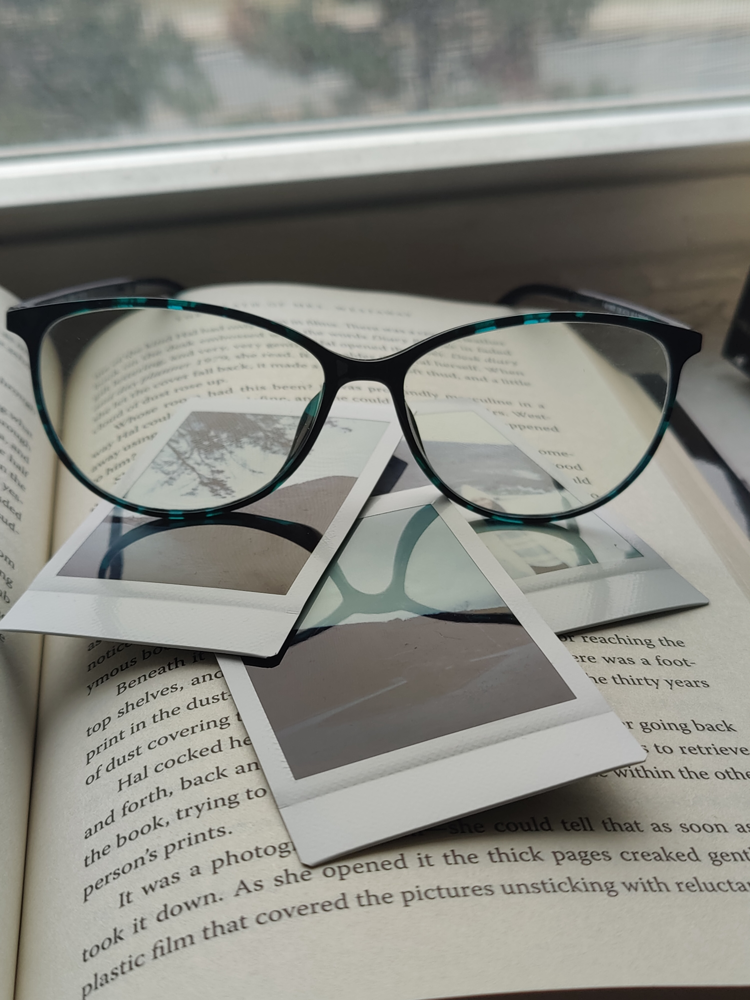

In [2]:
Image(filename='./images/movie_poster.jpg', width=400, height=200)

We are using Pillow, NumPy, CV2 libraries to edit the images

In [3]:
ImageOps.expand(pi.open('./images/movie_poster.jpg'), border=(50,50),fill='black').save('./images/movie_poster2.jpg')

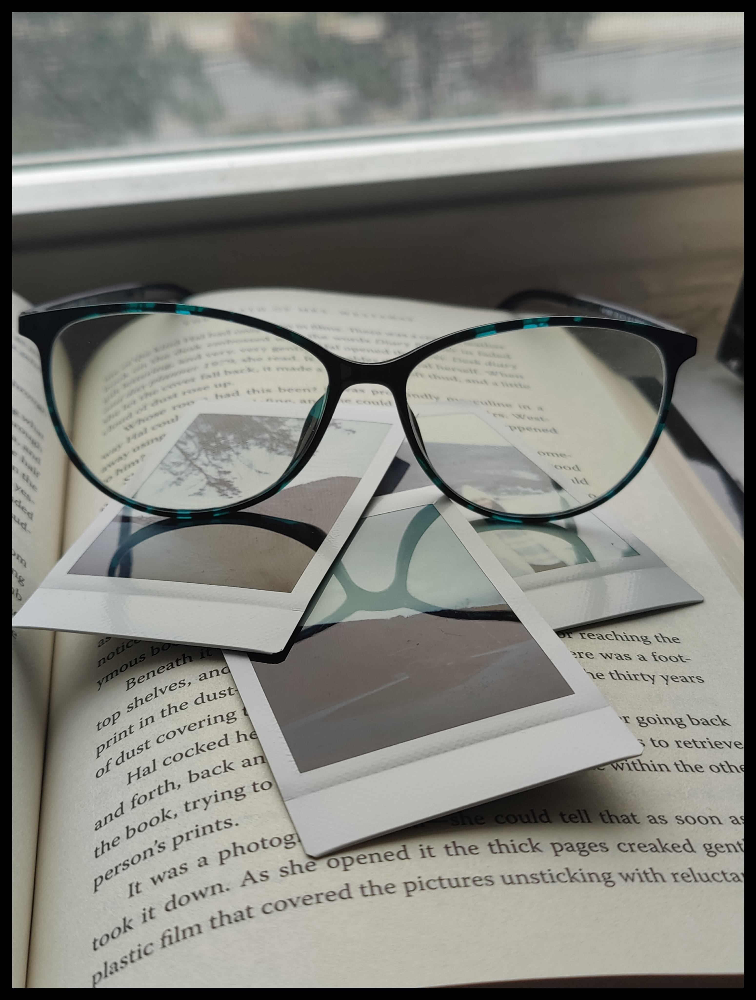

In [4]:
Image(filename='./images/movie_poster2.jpg', width=400)

Black & White Image

We are using the cv2 library to convert image into gray image

First, we use COLOR_BGR2RGB to convert BGR color space to RGB color space, this is done for the purposes of feasible editing. This is done with the help of cvtColor function

/var/folders/5v/r1ncqvs52wl9jc1_bf2gsgpw0000gn/T/ipykernel_15501/817709701.py:17: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  resized_gray_pil = gray_pil.resize((w, h), Image.ANTIALIAS)


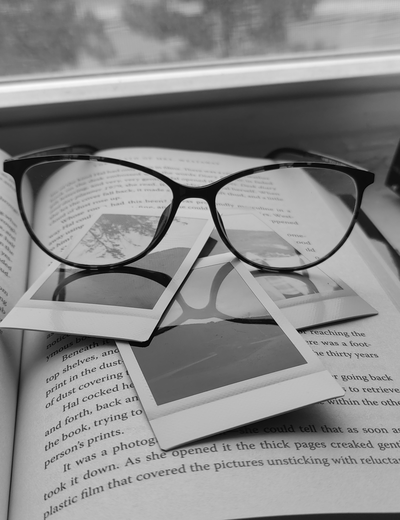

In [5]:
from PIL import Image
import cv2 
from IPython.display import display

img = cv2.imread('./images/movie_poster.jpg', cv2.IMREAD_UNCHANGED)
img_pil = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # Converting BGR to RGB

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

gray_pil = cv2.cvtColor(gray, cv2.COLOR_BGR2RGB) # Converting BGR to RGB

gray_pil = Image.fromarray(gray_pil)

h = 520
w = 400
    
resized_gray_pil = gray_pil.resize((w, h), Image.ANTIALIAS)
display(resized_gray_pil)

Adding blur to the image using medianBlur. The blur aspect can be modified by incrementing/decrementing the value taken by medianBlur

Also, here we have used resize() and Image.ANTIALIAS options to resample our image

/var/folders/5v/r1ncqvs52wl9jc1_bf2gsgpw0000gn/T/ipykernel_15501/1387543541.py:9: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  resized_gray_blur_pil = gray_blur_pil.resize((w, h), Image.ANTIALIAS)


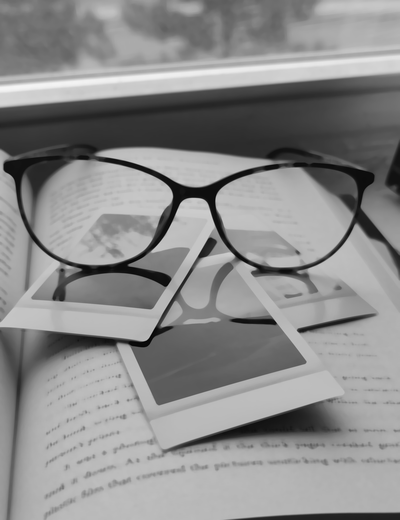

In [6]:
gray_blur = cv2.medianBlur(gray, 33)

gray_blur_pil = cv2.cvtColor(gray_blur, cv2.COLOR_BGR2RGB) # Converting BGR to RGB
gray_blur_pil = Image.fromarray(gray_blur_pil)

h = 520
w = 400

resized_gray_blur_pil = gray_blur_pil.resize((w, h), Image.ANTIALIAS)
display(resized_gray_blur_pil)

Drawing the edges

/var/folders/5v/r1ncqvs52wl9jc1_bf2gsgpw0000gn/T/ipykernel_15501/3118325773.py:8: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  resized_bigedges_pil = bigedges_pil.resize((w, h), Image.ANTIALIAS)


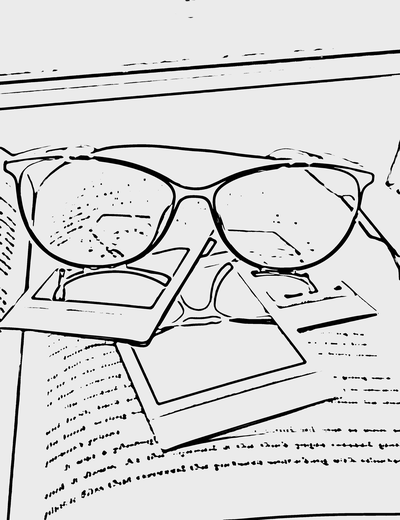

In [7]:
bigedges = cv2.adaptiveThreshold(gray_blur, 235, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 43, 7)
bigedges_pil = cv2.cvtColor(bigedges, cv2.COLOR_BGR2RGB) # Converting BGR to RGB
bigedges_pil = Image.fromarray(bigedges_pil)

h = 520
w = 400

resized_bigedges_pil = bigedges_pil.resize((w, h), Image.ANTIALIAS)
display(resized_bigedges_pil)

Cartoonizing the Image

/var/folders/5v/r1ncqvs52wl9jc1_bf2gsgpw0000gn/T/ipykernel_15501/2058690594.py:8: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  resized_cartoon_pil = cartoon_pil.resize((w, h), Image.ANTIALIAS)


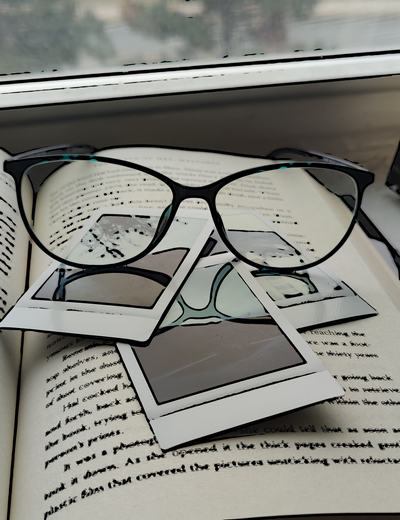

In [8]:
cartoon = cv2.bitwise_and(img, img, mask=bigedges)
cartoon_pil = cv2.cvtColor(cartoon, cv2.COLOR_BGR2RGB) # Converting BGR to RGB
cartoon_pil = Image.fromarray(cartoon_pil)

h = 520
w = 400

resized_cartoon_pil = cartoon_pil.resize((w, h), Image.ANTIALIAS)
display(resized_cartoon_pil)

Adding Title to the Poster

We are using convert_from_image_to_cv2() method to convert RGB to BGR

In [9]:
import numpy as np


def convert_from_image_to_cv2(img: Image) -> np.ndarray:
    return cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)

We have created a convert_image_to_cartoon_with_text() method to add text to the cartoonized image.
We are using ImageFont library to use personal font files.

We are creating a blank canvas to add text in it.

In [10]:

def convert_image_to_cartoon_with_text(file_path, blur, line, font_size, **kwargs):

        imgc = cv2.imread(file_path, cv2.IMREAD_UNCHANGED)

        line_size = line
        blur_value = blur

        gray = cv2.cvtColor(imgc, cv2.COLOR_BGR2GRAY)
        gray_blur = cv2.medianBlur(gray, blur_value)
        bigedges = cv2.adaptiveThreshold(gray_blur, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, line_size, blur_value)
        bigedges_pil = cv2.cvtColor(bigedges, cv2.COLOR_BGR2RGB) # Converting BGR to RGB
        
        
        toon = cv2.bitwise_and(imgc, imgc, mask=bigedges)
        
        #Loading font using ImageFont 
        fnt = ImageFont.truetype('./fonts/typewriter.ttf', font_size)
        fnt2 = ImageFont.truetype('./fonts/subtypewriter.otf', 90)
        
        img = Image.fromarray(cv2.cvtColor(toon, cv2.COLOR_BGR2RGBA))
        
        #Created blank canvas for adding text 
        txt = Image.new('RGBA', img.size, (255,255,255,0))
        
        d = ImageDraw.Draw(txt)
        
        #Adding text in the blank canvas
        d.text((950, img.height - 750), "Mirage", font=fnt, fill=(255,255,255,255))
        d.text((900, img.height - 400), "Welcome to the other side.", font=fnt2, fill=(255,255,255,255))
        
        final_image = Image.alpha_composite(img, txt)
        
        final_image = final_image.convert("RGB")
        
        final_image = ImageOps.expand(final_image , border=(10,10), fill='black')
        
        return convert_from_image_to_cv2(final_image)


Generating the Poster

/var/folders/5v/r1ncqvs52wl9jc1_bf2gsgpw0000gn/T/ipykernel_15501/1351331875.py:9: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  resized_cblimg_pil = cblimg_pil.resize((w, h), Image.ANTIALIAS)


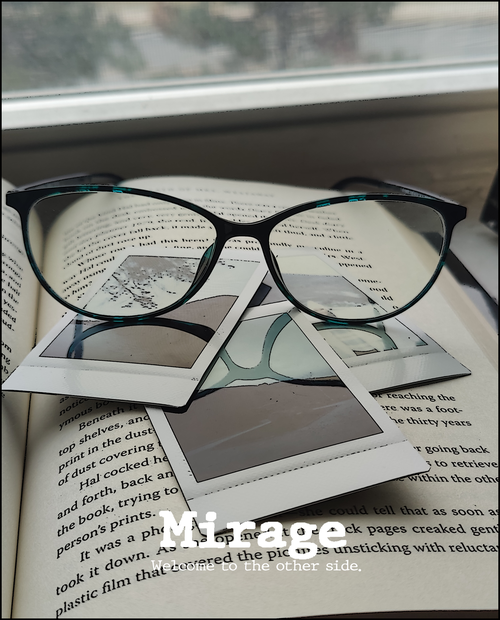

In [14]:
try:
    cblimg = convert_image_to_cartoon_with_text('./images/movie_poster.jpg', 7, 13, 300)
    cblimg_pil = cv2.cvtColor(cblimg, cv2.COLOR_BGR2RGB) # Converting BGR to RGB
    cblimg_pil = Image.fromarray(cblimg_pil)
    
    h = 620
    w = 500
    
    resized_cblimg_pil = cblimg_pil.resize((w, h), Image.ANTIALIAS)
    resized_cblimg_pil.save('./images/poster.jpg')
    display(resized_cblimg_pil)
except Exception as e:
    print(e)

Vertical Strip

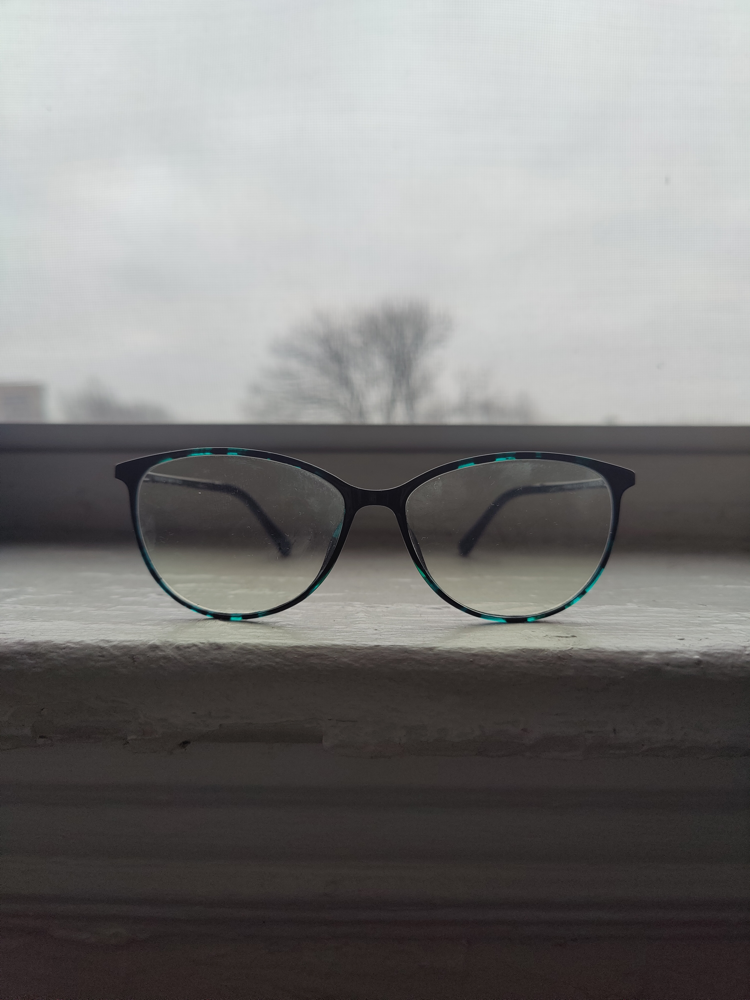

In [38]:
Image(filename='./images/object.jpg', width=400)

In [39]:

list_im = ['./images/object.jpg','./images/movie_poster.jpg']

imgs    = [ PIL.Image.open(i) for i in list_im ]

# pick the image which is the smallest, and resize the others to match it (can be arbitrary image shape here)
min_shape = sorted( [(np.sum(i.size), i.size ) for i in imgs])[0][1]
imgs_comb = np.vstack( (np.asarray( i.resize(min_shape) ) for i in imgs ) )

# save that beautiful picture
imgs_comb = PIL.Image.fromarray( imgs_comb)
imgs_comb.save( './images/mp_vertical.jpg' ) 

/var/folders/5v/r1ncqvs52wl9jc1_bf2gsgpw0000gn/T/ipykernel_94928/34505031.py:7: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  imgs_comb = np.vstack( (np.asarray( i.resize(min_shape) ) for i in imgs ) )


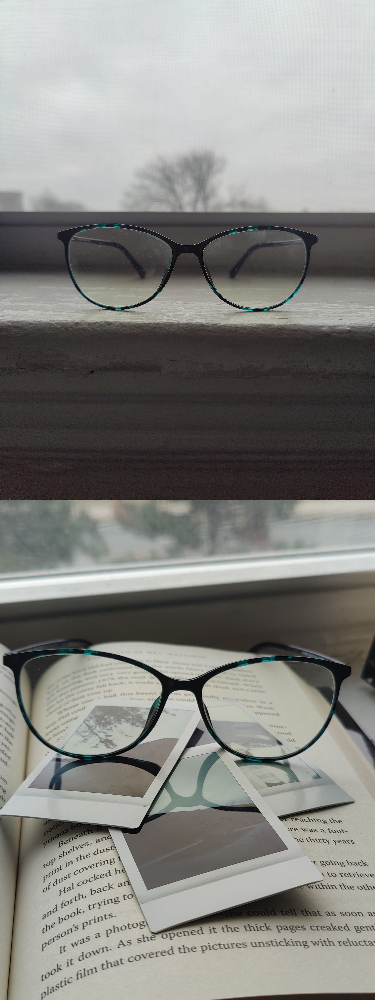

In [40]:
Image(filename='./images/mp_vertical.jpg', width=400)